# <font color="darkblue">Breast Cancer Diagnosis by Different Machine Learning Algorithms</color>
##### Name: Yijia.Jiang<br>ID: 1716303 

## Introduction
### Background
Breast cancer is a disease where cells in the breast grow out of control [1]. According to previous statistics, breast cancer can occur in both genders, while females are much more likely to suffer from this kind of cancer than males with the possbility of one of eighth, severely threatening feminine health. Breast cancer can be classified into benign breast tumor and malignant breast tumor. Substantial support for breast cancer awareness and research funding has helped created advances in the diagnosis and treatment of breast cancer. Recently, the 5-year survival rates and 10-year survival rates have both increased steadily, largely thanks to the earlier detection, the personalized treatment approach and a better understanding of the disease. 


### Project Purpose
There's a good chance of recovery if it's detected at an early stage wherein the machine learning algorithms are of great help. Therefore, this project is first aimed to explore the influential factors on breast cancer diagnosis and then construct the most effective and best performing machine learning model for breast cancer prediction to further improve the diagnostic accuracy.


### Project Description 
Here is the overview of my project process. 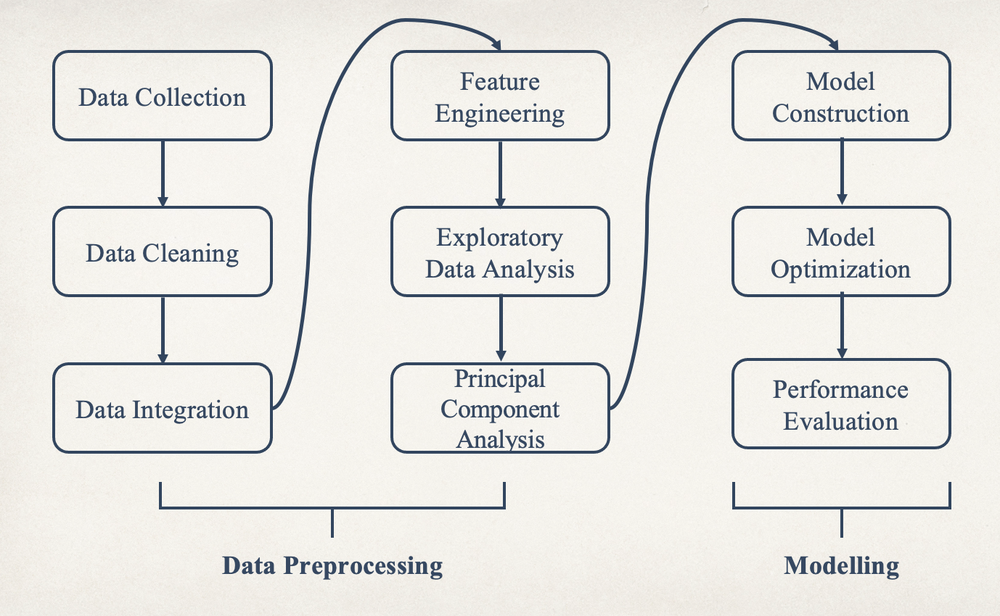

*Data preprocessing*
- The input to my predictor is the medical numerical data concerning the characteristics of the cell nuclei of those participants. Features are computed from digitized images of a fine needle aspirate (FNA) of a breast mass.
- Followed by importing the data, data cleaning was conducted to remove the irrelevant coloumns ''id' and 'Unnamed: 32'.

*Feature engineering*
- Data standardization was performed for feature engineering.

*Exploratory data analysis*
- Distribution of 10 features between benign and malignant cancers was obtained.
- Heatmap was plotted to reflect the correlaton among variables. 
- Existence of Multicollinearity in variables was found.

*Principal component analysis*
- PCA was conducted for reducing the feature dimension.

*Model construction & optimization*
- Five machine learning classification algorithms (namely logistic regression, decision tree, random forest, K-nearest neighbor, extreme gradient boost) were applied to output a classified tumor diagnosis.
- Three techniques including grid search, cross-validation and hyperparameter tuning tools were employed for optimization.

*Performace evaluation*
- Two performance metrics consisting of ROC curve and confusion matrix were utilized to measure the quality of models on this classification problem. 

<br>

## Related Work

Previous research [2] applied the different algorithm models from my work to diagnose breast cancer, for example, Naïve Bayes, Support vector machines, Radial basis neural networks, Decision trees J48 and simple CART. Both binary and multi class datasets, namely WBC, WDBC and Breast tissue were used for analysis, which also differed from one class of my project. Their conclusion is that SVM-RBF kernel always outperforms than the other classifiers in performance for both binary and multiclass datasets. The strengths of their work is shown in their richness of data. 
<br>
<br>
Another studies [3] focused on using algorithms in a different way depending on dataset and parameter selection for breast cancer diagnosis and recurrence prediction. They concluded that KNN technique has given the best results in diagnosis of breast cancer. And SVM using Gaussian kernel is the most suited technique for recurrence/non-recurrence prediction of breast cancer. Their project also used two datasets for analysis. However, we can notice a serve problems of overfitting, which is avoided in my project.

---

#### Packages Loading

In [2]:
# Packages Loading
# Loading dataset
import pandas as pd
import numpy as np
# Visualisation
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff
# EDA
import statsmodels.formula.api as smf
# Data preprocessing
from sklearn.preprocessing import StandardScaler
# PCA
from sklearn.decomposition import PCA
# Data splitting
from sklearn.model_selection import train_test_split
# Data modeling
from sklearn.model_selection import cross_val_score,GridSearchCV
from sklearn.metrics import confusion_matrix,accuracy_score,roc_curve,auc
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier

### Data Preprocessing

#### Data import
The used data can be found in my GitHub repository: https://github.com/YijiaJiang/INT305/blob/main/data.csv, or you can download it from UCI Machine Learning Repository: https://archive.ics.uci.edu/ml/datasets/Breast+Cancer+Wisconsin+%28Diagnostic%29. [4]

In [3]:
# Read the required data 
df = pd.read_csv('/Users/jiangyijia/data.csv')
print('Dataset :',df.shape)
df.info()
df.isnull().sum()

Dataset : (569, 33)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perime

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

We can notice that there exist 569 missing values. Particularly, all features are complete, except for 'Unnamed: 32', which is completely null. It is likely that this feature is an error existing in the dataset and therefore we have to drop it in the following operations.

#### Feature descriptions

In [4]:
# Drop useless variables
df = df.drop(['id','Unnamed: 32'],axis= 1)
# Reassign target("M" to 1 and "B" to 0)
df.diagnosis.replace(to_replace = dict(M = 1, B = 0), inplace = True)

After data cleaning, there remains altogether 569 samples. The mean, standard error and worst of each feature were also computed, resulting in a total of 10 x 3 = 30 features in the dataset excluding the target variable. The diagnosis of breast cancer is classified into benign (expressed by "0") breast tumor and malignant breast cancer (expressed by "1"). 

**Target features** 
- dignosis (Transformation from categorical data to numerical)

**Numerical features**
- radius (mean of distances from center to points on the perimeter)
- texture (standard deviation of gray-scale values)
- perimeter
- area
- smoothness (local variation in radius lengths)
- compactness (perimeter^2 / area - 1.0)
- concavity (severity of concave portions of the contour)
- symmetry
- fractal dimension ("coastline approximation" - 1)


### EDA (Exploratory Data Analysis)

In [5]:
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [6]:
df.describe()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,0.372583,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,0.483918,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,0.000000,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,0.000000,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,0.000000,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,1.000000,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,1.000000,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


#### Distribution of diagnosis with bar chat and pie chart

In [7]:
# Define the variable "diagnosis"
M = df[(df['diagnosis'] != 0)]
B = df[(df['diagnosis'] == 0)]
# Plot the bar chart of count of diagnosis variable
trace = [go.Bar(x = ['Malignant', 'Benign'], y = (len(M), len(B)), opacity = 0.8, 
                marker=dict(color=[ 'gold', 'lightskyblue'],line=dict(color='#000000',width=1.5)))]
layout = dict(title =  'Count of diagnosis variable')                    
figure = dict(data = trace, layout=layout)
py.iplot(figure)

In [8]:
# Plot the pie chart of percentage of diagnosis variable
trace = [go.Pie(labels = ['benign','malignant'], values = df['diagnosis'].value_counts(), hole=0.2,
                textfont=dict(size=15), opacity = 0.8,
                marker=dict(colors=['lightskyblue', 'gold'], 
                            line=dict(color='#000000', width=1.5)))]
layout = dict(title =  'Distribution of diagnosis variable')                    
figure = dict(data = trace, layout=layout)
py.iplot(figure)

Among the 569 samples, 357 were benign breast cancers and 212 were malignant breast cancers, accounting for 62.7%  and 37.3% for total, respectively. In simple terms, there are more cancer cells that are benign than those malignant.

In [9]:
# Define the distribution of all the variables 
def plot_distribution(data_select, bin_size) :  
    tmp1 = M[data_select]
    tmp2 = B[data_select]
    hist_data = [tmp1, tmp2]    
    group_labels = ['malignant', 'benign']
    colors = ['#FFD700', '#7EC0EE']
    fig = ff.create_distplot(hist_data, group_labels, colors = colors, 
                             show_hist = False, bin_size = bin_size, curve_type='kde')    
    fig['layout'].update(title = "The distribution of "+data_select)
    py.iplot(fig, filename = 'Density plot')

In [10]:
# Plot distribution "mean"
plot_distribution('radius_mean', .5)
plot_distribution('texture_mean', .5)
plot_distribution('perimeter_mean', 5)
plot_distribution('area_mean', 10)
plot_distribution('smoothness_mean', .5)
plot_distribution('compactness_mean', .5)
plot_distribution('concavity_mean', .5)
plot_distribution('concave points_mean', .5)
plot_distribution('symmetry_mean', .5)
plot_distribution('fractal_dimension_mean', .5)

In [11]:
# Plot distribution "se"
plot_distribution('radius_se', .5)
plot_distribution('texture_se', .5)
plot_distribution('perimeter_se', 5)
plot_distribution('area_se', 10)
plot_distribution('smoothness_se', .05)
plot_distribution('compactness_se', .2)
plot_distribution('concavity_se', .2)
plot_distribution('concave points_se', .1)
plot_distribution('symmetry_se', .1)
plot_distribution('fractal_dimension_se', .02)

In [12]:
# Plot distribution "worst"
plot_distribution('radius_worst', .5)
plot_distribution('texture_worst', .5)
plot_distribution('perimeter_worst', 5)
plot_distribution('area_worst', 10)
plot_distribution('smoothness_worst', .5)
plot_distribution('compactness_worst', .5)
plot_distribution('concavity_worst', .5)
plot_distribution('concave points_worst', .5)
plot_distribution('symmetry_worst', .5)
plot_distribution('fractal_dimension_worst', .3)

For most features, whatever the mean or standard error or worst value, the curve for malignant breast cancer is much flatter than that for benign tumor, which will be more accurate in the following results.

In [13]:
# For each column, print the min and max values for malignant and benign tumors
diagnosis = df["diagnosis"].copy()
features = df.drop(columns = {"diagnosis"}).copy()

for column in features.columns:
    mal = df.loc[df["diagnosis"] == 1][column]
    ben = df.loc[df["diagnosis"] == 0][column]    
    print("The max and min malignant values for {} are {}, {}".format(column, mal.max(), mal.min())) 
    print("The max and min benign values for {} are {}, {}".format(column, ben.max(), ben.min()))

The max and min malignant values for radius_mean are 28.11, 10.95
The max and min benign values for radius_mean are 17.85, 6.981
The max and min malignant values for texture_mean are 39.28, 10.38
The max and min benign values for texture_mean are 33.81, 9.71
The max and min malignant values for perimeter_mean are 188.5, 71.9
The max and min benign values for perimeter_mean are 114.6, 43.79
The max and min malignant values for area_mean are 2501.0, 361.6
The max and min benign values for area_mean are 992.1, 143.5
The max and min malignant values for smoothness_mean are 0.1447, 0.07371
The max and min benign values for smoothness_mean are 0.1634, 0.052629999999999996
The max and min malignant values for compactness_mean are 0.3454, 0.04605
The max and min benign values for compactness_mean are 0.2239, 0.01938
The max and min malignant values for concavity_mean are 0.4268, 0.02398
The max and min benign values for concavity_mean are 0.4108, 0.0
The max and min malignant values for concav

Overall, similar with the results from the above figures, it seems that malignant tumors tend to have higher minimum and maximum, although with overlap to benign values. This result fits most variables, except for variables such as concavity, which appears to completely overlap the malignant numbers with the benign. 

#### Correlation among features

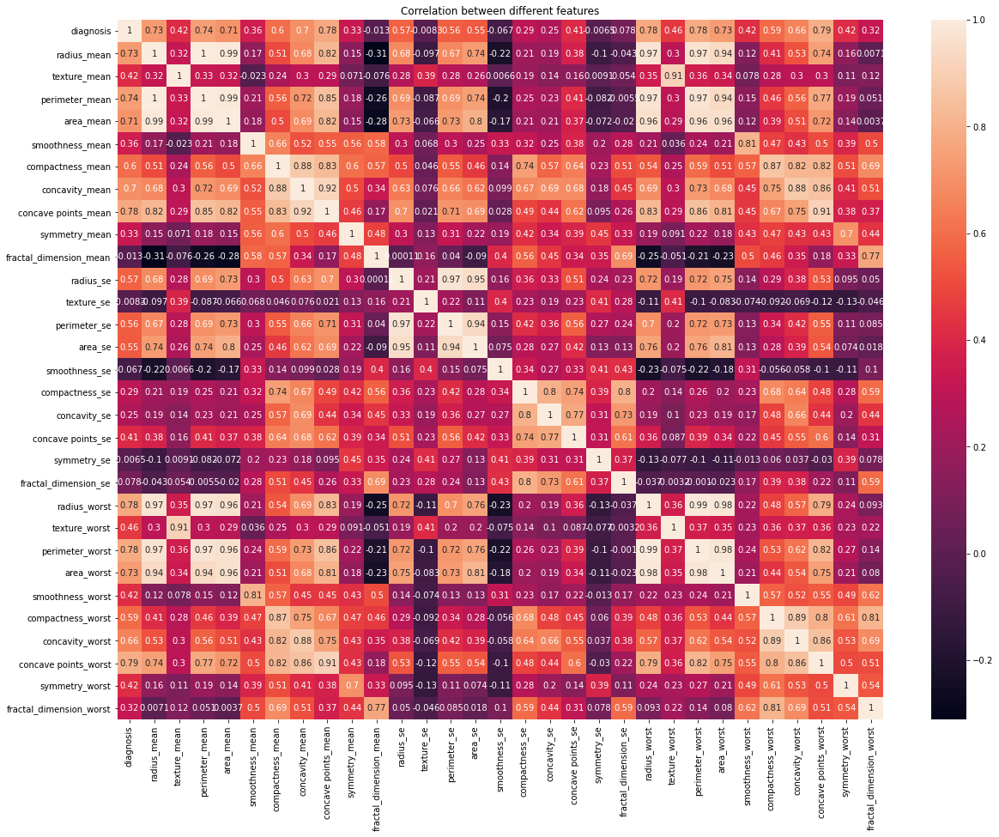

In [14]:
# Plot the heatmap showing correlation between predicting variables 
plt.figure(figsize=(20,15))
sns.heatmap(df.corr(), annot=True)
plt.title('Correlation between different features')
plt.show()

We obtained the heatmap of correlation among the variables. The color palette in the right side indicates the amount of correlation among the variables. The lighter box represents a higher positive correlation. The congestion of light boxes whose correlation is larger than 0.90 makes me wonder if there exists a multicollinearity in the predicted variables. 

In [15]:
# Calculate the correlation with diagnosis
results = smf.ols('diagnosis ~ radius_mean', data=df).fit()

def corr(data, col1, col2):
    a = data[col1].corr(df[col2])
    if a > 0:
        print(col2 + ' has a positive correlation with ' + col1 +': '+ str(a))
    else:
        print(col2 + ' has a negative correlation with ' + col1 +': '+ str(a))

corr(df, 'diagnosis','radius_mean')
corr(df, 'diagnosis','texture_mean')
corr(df, 'diagnosis','perimeter_mean')
corr(df, 'diagnosis','area_mean')
corr(df, 'diagnosis','smoothness_mean')
corr(df, 'diagnosis','compactness_mean')
corr(df, 'diagnosis','concave points_mean')
corr(df, 'diagnosis','symmetry_mean')
corr(df, 'diagnosis','fractal_dimension_mean')
print("\n")
corr(df, 'diagnosis','radius_se')
corr(df, 'diagnosis','texture_se')
corr(df, 'diagnosis','perimeter_se')
corr(df, 'diagnosis','area_se')
corr(df, 'diagnosis','smoothness_se')
corr(df, 'diagnosis','compactness_se')
corr(df, 'diagnosis','concave points_se')
corr(df, 'diagnosis','symmetry_se')
corr(df, 'diagnosis','fractal_dimension_se')
print("\n")
corr(df, 'diagnosis','radius_worst')
corr(df, 'diagnosis','texture_worst')
corr(df, 'diagnosis','perimeter_worst')
corr(df, 'diagnosis','area_worst')
corr(df, 'diagnosis','smoothness_worst')
corr(df, 'diagnosis','compactness_worst')
corr(df, 'diagnosis','concave points_worst')
corr(df, 'diagnosis','symmetry_worst')
corr(df, 'diagnosis','fractal_dimension_worst')

radius_mean has a positive correlation with diagnosis: 0.7300285113754555
texture_mean has a positive correlation with diagnosis: 0.4151852998452037
perimeter_mean has a positive correlation with diagnosis: 0.7426355297258321
area_mean has a positive correlation with diagnosis: 0.7089838365853895
smoothness_mean has a positive correlation with diagnosis: 0.3585599650859315
compactness_mean has a positive correlation with diagnosis: 0.5965336775082528
concave points_mean has a positive correlation with diagnosis: 0.7766138400204348
symmetry_mean has a positive correlation with diagnosis: 0.3304985542625466
fractal_dimension_mean has a negative correlation with diagnosis: -0.012837602698432335


radius_se has a positive correlation with diagnosis: 0.5671338208247169
texture_se has a negative correlation with diagnosis: -0.008303332973877427
perimeter_se has a positive correlation with diagnosis: 0.5561407034314825
area_se has a positive correlation with diagnosis: 0.5482359402780237
smoo

In [16]:
# Check if there exists a strong correlation with diagnosis (positive or negative)
corr_matrix = df.corr()
abs(corr_matrix["diagnosis"]).sort_values(ascending=False)

diagnosis                  1.000000
concave points_worst       0.793566
perimeter_worst            0.782914
concave points_mean        0.776614
radius_worst               0.776454
perimeter_mean             0.742636
area_worst                 0.733825
radius_mean                0.730029
area_mean                  0.708984
concavity_mean             0.696360
concavity_worst            0.659610
compactness_mean           0.596534
compactness_worst          0.590998
radius_se                  0.567134
perimeter_se               0.556141
area_se                    0.548236
texture_worst              0.456903
smoothness_worst           0.421465
symmetry_worst             0.416294
texture_mean               0.415185
concave points_se          0.408042
smoothness_mean            0.358560
symmetry_mean              0.330499
fractal_dimension_worst    0.323872
compactness_se             0.292999
concavity_se               0.253730
fractal_dimension_se       0.077972
smoothness_se              0

In order to identify if there exist a positive or a negative correlation or no patterns for the target feature, we print out in a ascending order. We found that concave points, perimeter, radius, area, concavity and compactness have relatively strong correlation with dignosis, while the remaining four features including smoothness, fractal dimension, texture and symmetry fail to be correlated with breast cancer diagnosis.

#### Determination of multicollinearity in variables

In [17]:
# Set the threshold to 0.75
corr = df.corr()
CorField = []
for i in corr:
    for j in corr.index[corr[i] > 0.75]:
        if i != j and j not in CorField and i not in CorField:
            CorField.append(j)
            print (i + " has a correlation value with "+ j, corr[i][corr.index == j].values[0])

diagnosis has a correlation value with concave points_mean 0.7766138400204361
diagnosis has a correlation value with radius_worst 0.7764537785950388
diagnosis has a correlation value with perimeter_worst 0.782914137173759
diagnosis has a correlation value with concave points_worst 0.7935660171412696
radius_mean has a correlation value with perimeter_mean 0.9978552814938113
radius_mean has a correlation value with area_mean 0.9873571700566119
radius_mean has a correlation value with area_worst 0.9410824595860459
texture_mean has a correlation value with texture_worst 0.9120445888404215
smoothness_mean has a correlation value with smoothness_worst 0.8053241954943631
compactness_mean has a correlation value with concavity_mean 0.8831206701772499
compactness_mean has a correlation value with compactness_worst 0.8658090398022638
compactness_mean has a correlation value with concavity_worst 0.8162752498000281
fractal_dimension_mean has a correlation value with fractal_dimension_worst 0.76729

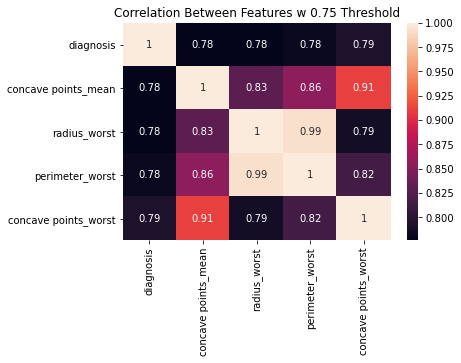

Features that heavily influence target are:  ['diagnosis', 'concave points_mean', 'radius_worst', 'perimeter_worst', 'concave points_worst']


In [18]:
threshold = 0.75
filter_features = np.abs(corr["diagnosis"]) > threshold
corr_features = corr.columns[filter_features].tolist()
sns.heatmap(df[corr_features].corr(),annot=True)
plt.title("Correlation Between Features w 0.75 Threshold")
plt.show()
print('Features that heavily influence target are: ', corr_features)

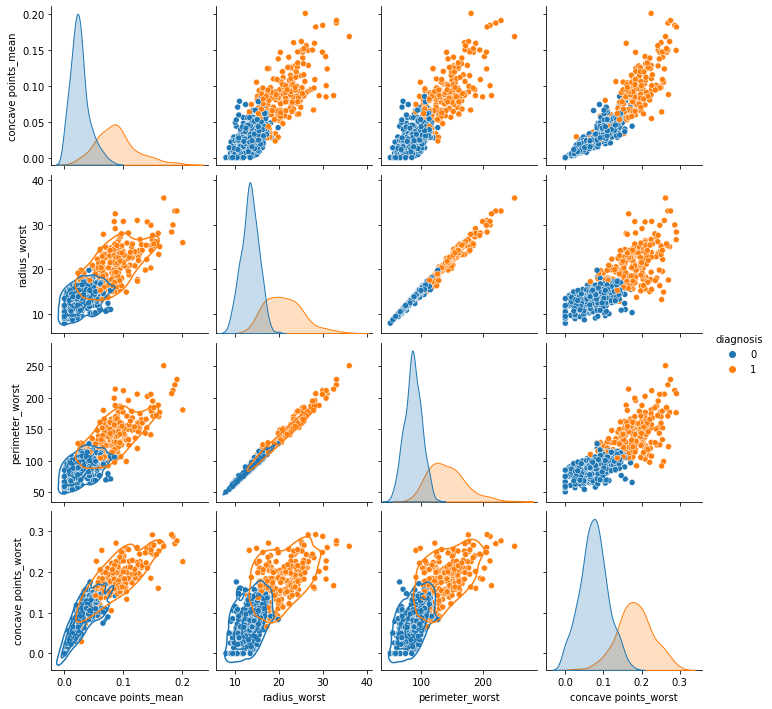

In [19]:
fig = sns.pairplot(df.loc[:,corr_features],hue = 'diagnosis',diag_kind="kde")
fig.map_lower(sns.kdeplot, levels=4, color=".2")

We can obviously see that two features (Radius, Perimeter) are linearly dependent. As expected, we have a severe problem of multicollinearity in our data, which requires preprocessing to reduce the feature dimension. Overlap between malignant cancers and benign cancers is relatively small.

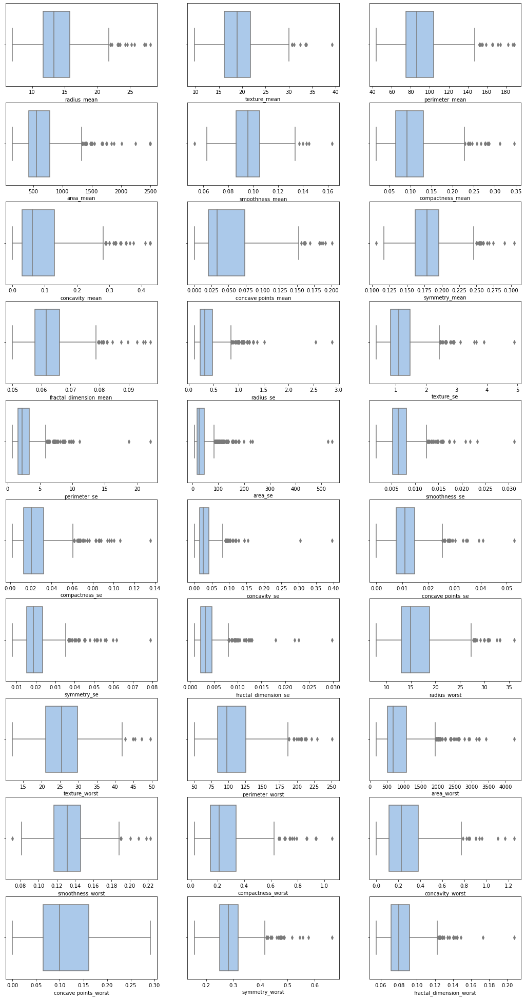

In [20]:
plt.figure(figsize=(18,35))
plotnumber =1
for column in df.columns[1:]:
    ax = plt.subplot(10,3,plotnumber)
    sns.boxplot(data = df, x = column, palette='pastel')
    plt.xlabel(column)
    plotnumber+=1
plt.show()

Boxplot allows us to analyse the outliers in our dataset and we can notice the existence of outliers. This work conducted PCA to reduce the feature dimension. Perhaps in the future work, we can remove these columns calculated with high VIFs and evaluate the effects of models. 

In [21]:
# Split the variables into three list
mean_list =[]
se_list =[]
worst_list =[]
for i in df.columns:
    f_list = i.split('_')
    if f_list[-1] == 'mean':
        mean_list.append(i)
    elif f_list[-1] == 'se':
        se_list.append(i)
    elif f_list[-1] == 'worst':
        worst_list.append(i)   

<AxesSubplot:xlabel='variable', ylabel='value'>

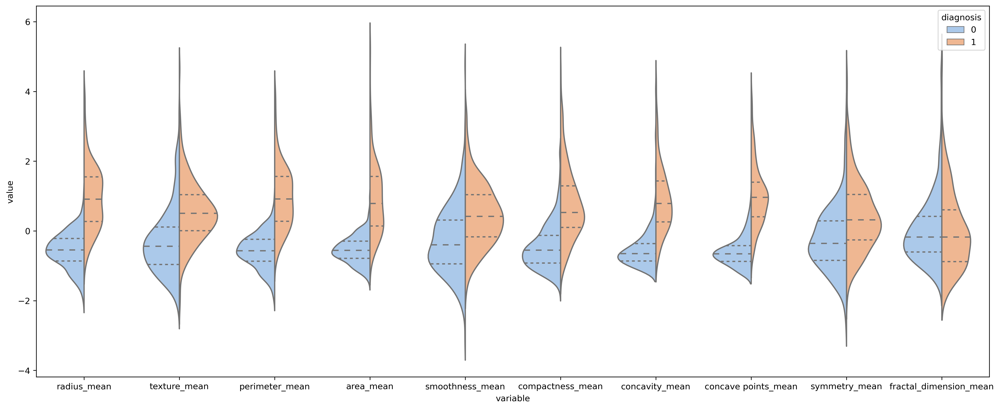

In [22]:
scaler = StandardScaler()
feat_scaled = pd.DataFrame(scaler.fit_transform(df[mean_list]),columns=mean_list, index = df.index)
data = pd.concat([df['diagnosis'],feat_scaled],axis=1)
df_melt = pd.melt(frame=data, value_vars=mean_list, id_vars=['diagnosis'])
fig, ax = plt.subplots(1, 1, figsize = (20, 8), dpi=300)
sns.violinplot(x="variable",y="value",hue = "diagnosis",data=df_melt,split = True, inner="quart",palette='pastel')

<AxesSubplot:xlabel='variable', ylabel='value'>

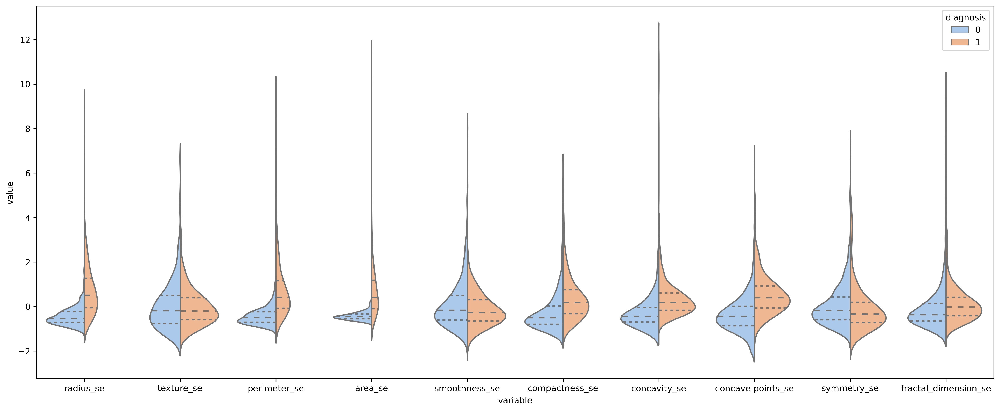

In [23]:
feat_scaled = pd.DataFrame(scaler.fit_transform(df[se_list]),columns=se_list, index = df.index)
data = pd.concat([df['diagnosis'],feat_scaled],axis=1)
df_melt = pd.melt(frame=data, value_vars=se_list, id_vars=['diagnosis'])
fig, ax = plt.subplots(1, 1, figsize = (20, 8), dpi=300)
sns.violinplot(x="variable",y="value",hue = "diagnosis",data=df_melt,split = True,  inner="quart", palette='pastel')

<AxesSubplot:xlabel='variable', ylabel='value'>

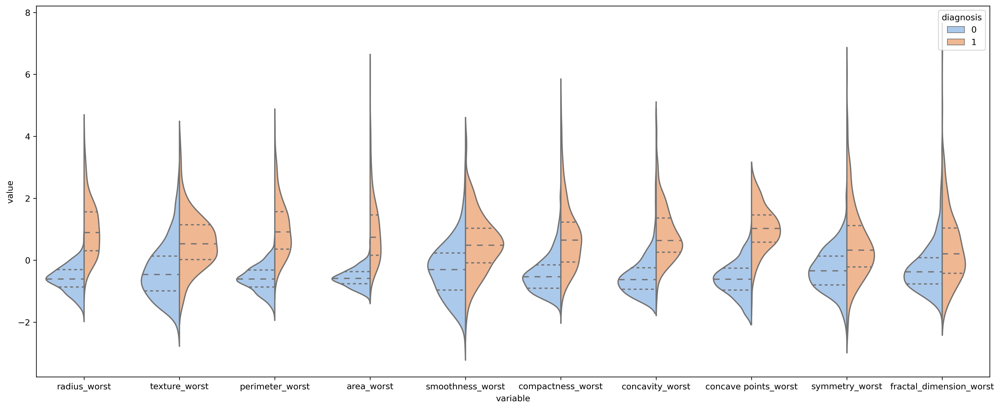

In [24]:
feat_scaled = pd.DataFrame(scaler.fit_transform(df[worst_list]),columns=worst_list, index = df.index)
data = pd.concat([df['diagnosis'],feat_scaled],axis=1)
df_melt = pd.melt(frame=data, value_vars=worst_list, id_vars=['diagnosis'])
fig, ax = plt.subplots(1, 1, figsize = (20, 8), dpi=300)
sns.violinplot(x="variable",y="value",hue = "diagnosis",data=df_melt,split = True,  inner="quart", palette='pastel',title='')

The violinplot shows the distribution of quantitative data at several levels for one or more categorical variables.
From the first violinplot, besides fractal dimension, all the features look promising at classifying cancer cells. We can see the evident differences between the two cancers that cancer cells that are malignant tend to have higher values in all of the features.

#### PCA（Principal Component Analysis）

In [25]:
# Preparation for building models
y=df['diagnosis']
x=df.drop('diagnosis',axis=1)
scaler = StandardScaler()
x = scaler.fit_transform(x)

- Data was standardization with the function StandardScaler() prior to PCA and the following model construction.
- For each characteristic dimension, the mean and variance are standardized. The equation is $x^* = \frac{x-\mu}{\sigma}$.
- After standardization, the speed of optimal solution of gradient descent is accelerated.
- Standardization has the potential to improve accuracy

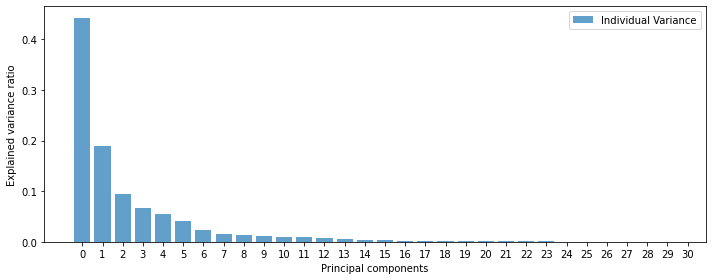

In [26]:
# Plot the principal components
plt.figure(figsize=(10,4))
plt.bar(range(30), PCA().fit(x).explained_variance_ratio_, alpha=0.7, align='center', label='Individual Variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components')
plt.legend(loc='best')
plt.xticks(np.arange(0, 31, 1.0))
plt.tight_layout()

([<matplotlib.axis.XTick at 0x7f80ac0d7df0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

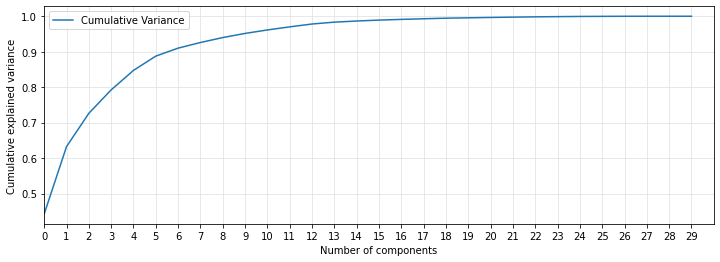

In [27]:
# Plot the cumulative variance
pca = PCA().fit(x)
plt.figure(figsize=(12, 4))
plt.plot(np.cumsum(pca.explained_variance_ratio_), label='Cumulative Variance')
plt.xlim(0,30,1)
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.legend(loc='best')
plt.grid(color='#E3E3E3')
plt.xticks(np.arange(0, 30, 1.0))

According to the cumulative explained variance figure, the curve increases steadily until it reach 14 principal components. Therefore, we chose 14 as the final number of principal components for further analysis.

#### Data split after PCA

In [28]:
# Dimension reduction
pca = PCA(n_components=14)
x = pca.fit_transform(x)
# Split dataset into 80% train, 20% test
X_train, X_test, y_train, y_test= train_test_split(x, y, test_size=0.2)
print("The number of training sample is {}.".format(X_train.shape[0]))
print("The number of testing sample is {}.".format(X_test.shape[0]))

The number of training sample is 455.
The number of testing sample is 114.


I chose the best number of components 14 prior to spliting the standardized dataset into two categories: 80% for training and 20% for testing. 

---

### Machine Learning Algorithm and Techniques:
In the following procedures, the five models were trained with the training data, and then applied to the testing data. 

***Logistic Regression***<br>
Logistic regression is a technique that can be applied to binary classification problems. This technique uses the logistic function or sigmoid function, which is an S-shaped curve that can assume any real value number and assign it to a value between 0 and 1, but never exactly in those limits. Thus, logistic regression models the probability of the default class (the probability that an input $(X)$ belongs to the default class $(Y=1)):(P(X)=P(Y=1|X))$.<br>
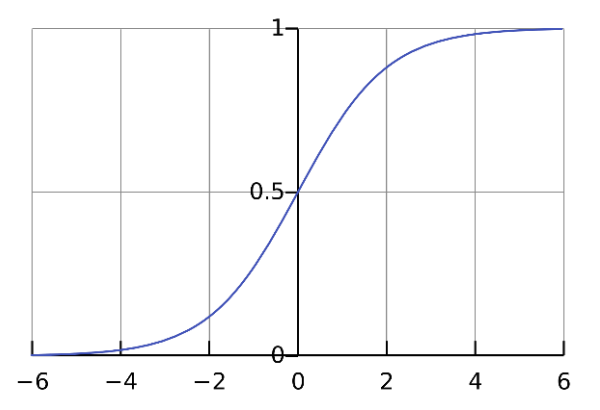


***Decision Tree***<br>
A decision tree is a flowchart-like tree structure where an internal node represents feature, the branch represents a decision rule, and each leaf node represents the outcome. The decision tree analyzes a set of data to construct a set of rules or questions, which are used to predict a class, i.e., the goal of decision tree is to create a model that predicts the value of a target variable by learning simple decision rules inferred from the data features. In this sense the decision tree selects the best attribute using to divide the records, converting that attribute into a decision node and dividing the data set into smaller subsets, to finally start the construction of the tree repeating this process recursively.<br><br>

***Random Forest***<br>
Random forest is a supervised learning algorithm that creates a forest randomly. This forest is a set of decision trees and trained with the bagging method most of the times. Each decision tree in the random forest can be understood as an expert proficient in a narrow field. In this way, there are many experts proficient in different fields in the random forest. A new problem (new input data) can be viewed from different perspectives, and the final result will be voted by each expert.<br>
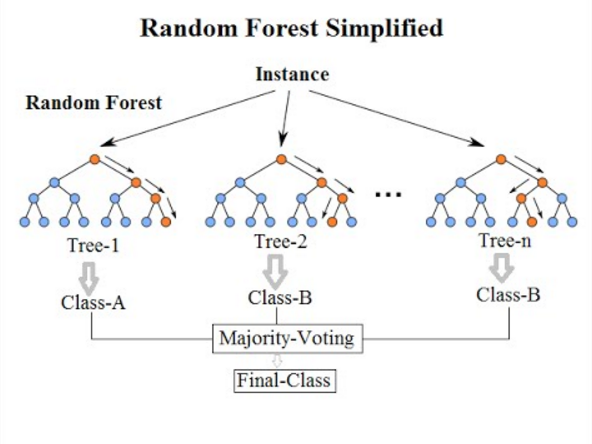

***K-nearest Neighbor***<br>
K-Nearest neighbors is a technique that stores all available cases and classifies new cases based on a similarity measure (e.g., distance functions). This technique is non-parametric since there are no assumptions for the distribution of underlying data and it is lazy since it does not need any training data point model generation. All the training data used in the test phase. This makes the training faster and the test phase slower and more costlier. In this technique, the number of neighbors k is usually an odd number if the number of classes is 2. For finding closest similar points, find the distance between points using distance measures such as Euclidean distance, Hamming distance, Manhattan distance and Minkowski distance.<br><br>

***Extreme Gradient Boosting***<br>
Extreme gradient boosting is an efficient open-source implementation of the stochastic gradient boosting ensemble algorithm. The trees are constructed iteratively until a stopping criterion is met.<br><br>

---

### Loss Function:
A loss function or cost function is a function that maps an event or values of one or more variables onto a real number intuitively representing some "cost" associated with the event. An optimization problem seeks to minimize a loss function. <br>

***Logistic Regression***:<br>
$ L(Y,P(Y|X)) = -logP(Y|X)$
<br><br>

***Decision Tree***:<br>
$C_a(T)=\sum_{t=1}^{|T|}N_tH_t(T)+\alpha|T|$
<br><br>

***Random Forest***:<br>
$gini(T)=1-\sum_{{p_j}^2=1} = 1-\sum_{(\frac{n_j}{S})^2=1}$ <br>
$gini_split(T)=\frac{S_1}{S_1+S_2}gini(T_1)+\frac{S_1}{S_1+S_2}gini(T_2)$
<br><br>

***K-nearest Neighbor***:<br>
$
L(Y|f(X))= \begin{cases}
1, {Y\neq f(X)}\\
0, {Y=f(X)}
\end{cases}
$
<br><br>

***Extreme Gradient Boosting***:<br>
$ L(y,f(x)) = exp[-yf(x)]$
<br><br>

---

### Performance Metrics:
    
***Accuracy***: 
$\frac{TP+TN}{TP+TN+FP+FN}$

***Precision***: 
$\frac{TP}{TP+FP}$

***Recall***: 
$\frac{TP}{TP+FN}$



---

#### Functions for Evaluation

- Grid search was performed to obtain the optimal hyperparameters applied for models. Each model were dealt with different hyperparameters. (i.e. 'C' for logistic regression and 'max_depth' for decision tree)
- Cross-validation is a resampling procedure used to evaluate machine learning models on a limited data sample. In my project, I set the parameter to 10 folds.
- The performance metrics are accuracy, precision, recall. Additionally, ROC curve which illustrates the diagnostic ability of a binary classifier system as its discrimination threshold is varied was plotted. Confusion matrix which allows visualization of the performance of an algorithm was also provided.

<br>

***Confusion matrix***: 
- True positive(TP): Malignant tumour correctly identified as malignant
- True negative(TN): Benign tumour correctly identified as benign
- False positive(FP): Benign tumour incorrectly identified as malignant
- False negative(FN): Malignant tumour incorrectly identified as benign

In [29]:
# Confusion matrix 
def plot_confusion_matrix(y_test,y_pred):
    CV = confusion_matrix(y_true=y_test, y_pred=y_pred)
    sns.heatmap(CV, annot=True)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.title('Confusion Matrix')
    plt.show()

In [30]:
# Cross-validation metrics
def cross_val_metrics(clf):
    scores = ['accuracy', 'precision', 'recall']
    for sc in scores:
        scores = cross_val_score(clf, x, y, cv = 10, scoring = sc) # 10-fold
        print('[%s] : %0.5f (+/- %0.5f)'%(sc, scores.mean(), scores.std()))

In [31]:
# ROC curve
def plot_roc(y_test, y_score):
    fpr, tpr, threshold = roc_curve(y_test, y_score)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label = 'AUC = %0.4f' % roc_auc, linewidth = 2)
    plt.legend(loc = 'lower right')
    plt.plot([0,1],[0,1], 'k--', linewidth = 2)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.show();

#### Logistic Regression

In [32]:
# Grid Search of Logistic Regression
param_grid = {'C':range(1, 200)}
log_clf = LogisticRegression()
grid = GridSearchCV(log_clf, param_grid, cv=10,scoring='accuracy')
grid.fit(X_train, y_train)
print("Best CV score: {:.3f}, best CV parameters: {}".format(
    grid.best_score_, grid.best_params_)
) 

Best CV score: 0.971, best CV parameters: {'C': 2}


[accuracy] : 0.97892 (+/- 0.01529)
[precision] : 0.98134 (+/- 0.02290)
[recall] : 0.96212 (+/- 0.03558)


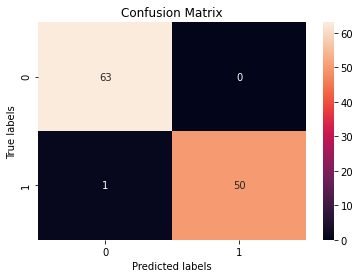

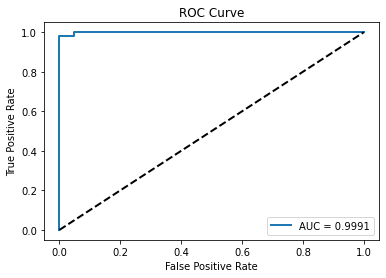

In [33]:
# Logistic Regression Results
log_clf = LogisticRegression(C=2)
log_clf.fit(X_train, y_train)
y_pred = log_clf.predict(X_test)
y_score = log_clf.predict_proba(X_test)[:,1]
cross_val_metrics(log_clf)
plot_confusion_matrix(y_test, y_pred)
plot_roc(y_test, y_score)

The hyperparameter tuned for logistic regression is C which represents the inverse of regularization strength. Like in support vector machines, smaller values of C specify stronger regularization. The optimal model is trained for the value of C of 2. The three performance metrics are given above. From the confusion matrix of logistic regression, only one samples were misclassified. The probability that the classifier ranks a randomly chosen positive instance higher than a randomly chosen negative one is reflected by AUC of 0.9991.<br>

---

#### Decision Tree

In [34]:
# Grid Search of Decision Tree
param_grid = {'criterion':['gini', 'entropy'],'max_depth':np.arange(3,11,1)}
tree_clf = DecisionTreeClassifier()
grid = GridSearchCV(tree_clf, param_grid, cv=10,scoring='accuracy')
grid.fit(X_train, y_train)
print("Best CV score: {:.3f}, best CV parameters: {}".format(
    grid.best_score_, grid.best_params_)
) 

Best CV score: 0.965, best CV parameters: {'criterion': 'entropy', 'max_depth': 5}


[accuracy] : 0.93324 (+/- 0.03398)
[precision] : 0.91576 (+/- 0.05644)
[recall] : 0.91558 (+/- 0.07281)


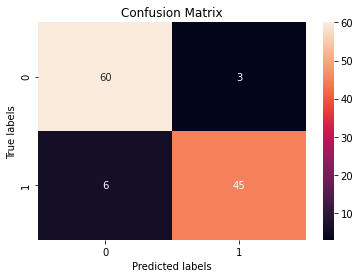

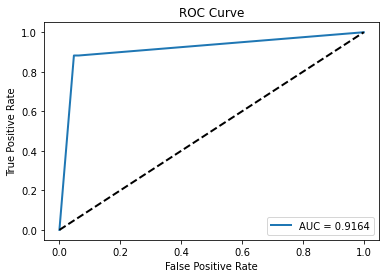

In [35]:
# Decision Tree Results
tree_clf = DecisionTreeClassifier(criterion='entropy',max_depth=5)
tree_clf.fit(X_train, y_train)
y_pred = tree_clf.predict(X_test)
y_score = tree_clf.predict_proba(X_test)[:,1]
cross_val_metrics(tree_clf)
plot_confusion_matrix(y_test, y_pred)
plot_roc(y_test, y_score)

The hyperparameters tuned for decision tree are 'criterion' which represents the function to measure the quality of a split and 'max_depth'. Supported criteria are “gini” for the Gini impurity and “entropy” for the information gain. The optimal model is trained, with the three performance metrics. From the confusion matrix of decision tree, 9 samples were misclassified. AUC is 0.9164 which reflects the probability that the classifier ranks a randomly chosen positive instance higher than a randomly chosen negative one. <br>

--- 

#### Random Forest

In [36]:
# Grid Search of Random Forest
param_grid = {'criterion':['gini', 'entropy'],
              'n_estimators':np.arange(10,101,10)}
forest_clf = RandomForestClassifier()
grid = GridSearchCV(forest_clf, param_grid, cv=10,scoring='accuracy')
grid.fit(X_train, y_train)
print("Best CV score: {:.3f}, best CV parameters: {}".format(
    grid.best_score_, grid.best_params_)
) 

Best CV score: 0.952, best CV parameters: {'criterion': 'entropy', 'n_estimators': 80}


[accuracy] : 0.94903 (+/- 0.02142)
[precision] : 0.93537 (+/- 0.04145)
[recall] : 0.92922 (+/- 0.04288)


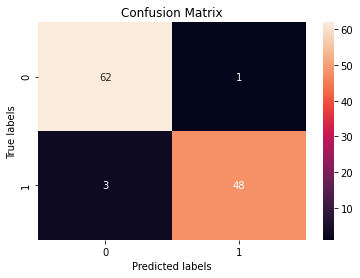

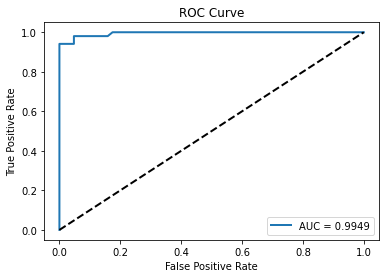

In [40]:
# Random Forest Results
forest_clf = RandomForestClassifier(criterion='entropy',n_estimators=80)
forest_clf.fit(X_train, y_train)
y_pred = forest_clf.predict(X_test)
y_score = forest_clf.predict_proba(X_test)[:,1]
cross_val_metrics(forest_clf)
plot_confusion_matrix(y_test, y_pred)
plot_roc(y_test, y_score)

The hyperparameters tuned for random forest are 'criterion' which represents the function to measure the quality of a split and 'n_estimator' which means the number of trees in the forest. The optimal model is trained, with the three performance metrics. From the confusion matrix of random forest, 4 samples were misclassified. AUC is 0.9947 which reflects the probability that the classifier ranks a randomly chosen positive instance higher than a randomly chosen negative one.<br>

---

#### K-nearst Neighbors

In [41]:
# Grid Search of KNeighborsClassifier
param_grid = {'n_neighbors':np.arange(1,20,1)}
knn_clf = KNeighborsClassifier()
grid = GridSearchCV(knn_clf, param_grid, cv=10,scoring='accuracy')
grid.fit(X_train, y_train)
print("Best CV score: {:.3f}, best CV parameters: {}".format(
    grid.best_score_, grid.best_params_)
) 

Best CV score: 0.969, best CV parameters: {'n_neighbors': 7}


[accuracy] : 0.96836 (+/- 0.01531)
[precision] : 0.98613 (+/- 0.02122)
[recall] : 0.92900 (+/- 0.04860)


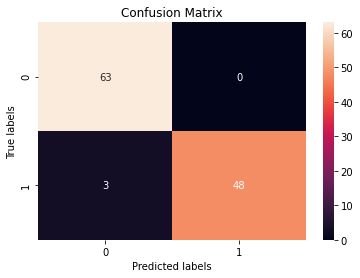

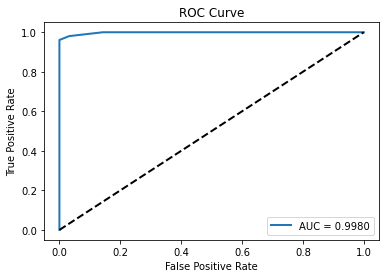

In [42]:
# KNeighborsClassifier Results
knn_clf = KNeighborsClassifier(n_neighbors=7)
knn_clf.fit(X_train, y_train)
y_pred = knn_clf.predict(X_test)
y_score = knn_clf.predict_proba(X_test)[:,1]
cross_val_metrics(knn_clf)
plot_confusion_matrix(y_test, y_pred)
plot_roc(y_test, y_score)

The hyperparameter tuned for KNN is 'n_neighbors' which represents the number of neighbors to use. The optimal model is trained with 3 neighbours. According to the confusion matrix of k-nearst neighbor classification, only 3 samples were misclassified. AUC is 0.9980 which reflects the probability that the classifier ranks a randomly chosen positive instance higher than a randomly chosen negative one. <br>

---

#### Extreme Gradient Boosting

In [43]:
# Grid Search of Extreme Gradient Boost
param_grid = {'learning_rate':np.arange(0.1,1,0.1),
              'n_estimators':np.arange(1,101,10)}
gb_clf = GradientBoostingClassifier()
grid = GridSearchCV(gb_clf, param_grid, cv=10,scoring='accuracy')
grid.fit(X_train, y_train)
print("Best CV score: {:.3f}, best CV parameters: {}".format(
    grid.best_score_, grid.best_params_)
) 

Best CV score: 0.956, best CV parameters: {'learning_rate': 0.6, 'n_estimators': 91}


[accuracy] : 0.96310 (+/- 0.02280)
[precision] : 0.96261 (+/- 0.03443)
[recall] : 0.94351 (+/- 0.05857)


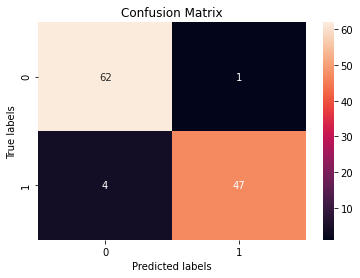

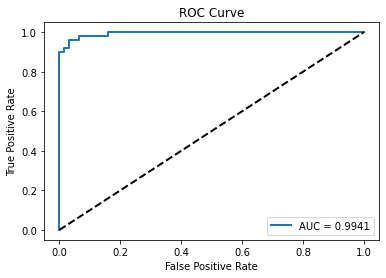

In [44]:
# Extreme Gradient Boost Results
gb_clf = GradientBoostingClassifier(learning_rate=0.6,n_estimators=91)
gb_clf.fit(X_train, y_train)
y_pred = gb_clf.predict(X_test)
y_score = gb_clf.predict_proba(X_test)[:,1]
cross_val_metrics(gb_clf)
plot_confusion_matrix(y_test, y_pred)
plot_roc(y_test, y_score)

The hyperparameter tuned for XGBoosting is 'learning_rate' which represents the rate the contribution of each tree shrinks and 'n_estimators' which indicates the number of boosting stages to perform. The optimal model is trained, with performance metrics shown. According to the confusion matrix of XGBoosting, 8 samples were misclassified. AUC is 0.9692 which reflects the probability that the classifier ranks a randomly chosen positive instance higher than a randomly chosen negative one. <br>

---

#### Performance Evaluation

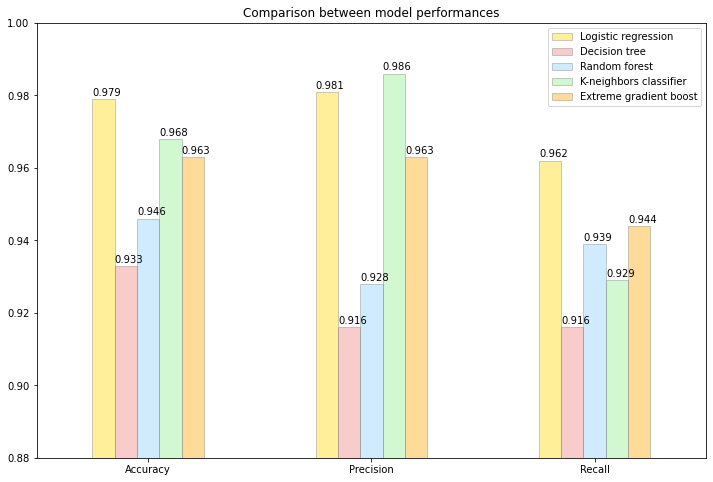

In [45]:
models_metrics = {'Logistic regression': [0.979, 0.981, 0.962], 
                  'Decision tree': [0.933, 0.916, 0.916],
                  'Random forest' : [0.946, 0.928, 0.939],
                  'K-neighbors classifier':[0.968, 0.986, 0.929],
                  'Extreme gradient boost':[0.963, 0.963, 0.944]}
df_performance = pd.DataFrame(data = models_metrics)
df_performance.rename(index={0:'Accuracy',1:'Precision', 2: 'Recall'}, inplace=True)
ax = df_performance.plot(kind='bar', figsize = (12,8), ylim = (0.88,1), 
                         color = ['gold', 'lightcoral', 'lightskyblue','lightgreen','orange'],
                         rot = 0, title ='Comparison between model performances',
                         edgecolor = 'grey', alpha = 0.4)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.0005, p.get_height() * 1.001))
plt.show()

## Conclusion

- Overall, this project is satisfactory. Logistic regression outperforms the other four algorithms. In other words, the logistic regression with C=1 is most suitable for the breast cancer classification, with a training accuracy of 0.979 and AUC of 0.999. The problem of overfitting didn't occur.
- Limitations also exist in my project. First of all, the size of our dataset is only 569, which is lack of objectivity and accuracy. Secondly, we failed to optimize the five models to the most appropraite state. Future work can further optimize it by using loss function to observe. 
- In the future, the columns calculated with high VIFs can be removed. The performance with this kind of feature dimension can be evaluated and compared with that using PCA. As one of its disadvantages is that our predictor variables become less interpretable. In other words, PCA makes it more difficult for us to determine the features that are important in classifying cancer cells. This is largely due to the underlying algorithm of the PCA which turns the original features in the dataset into principal components which are linear combinations of different features.
- Other robust algorithms such as SVM should be considered for further analysis. 

<br>

## References

[1] N. Harbeck et al., “Breast cancer,” *Nat. Rev. Dis. Prim.*, 2019, doi: 10.1038/s41572-019-0111-2.<br>
[2] S. Aruna, S. P. Rajagopalan, and L. V Nandakishore, “Knowledge Based Analysis of Various Statistical Tools in Detecting Breast Cancer,”*Comput. Sci. Inf. Technol.*, 2011. <br>
[3] M. U. Student, FRCRCE and M. Student, FRCRCE, “Student, FRCRCE, Mumbai University 2,” *IJRET Int. J. Res. Eng. Technol.*, pp. 2319–1163, 2015, [Online]. Available: https://pdfs.semanticscholar.org/37d6/15247b7acb02d8b9e2d7dcc7d98eb5ef29a4.pdf.<br>
[4] W. Worlberg, W. N. Street, and O. Mangasarian, “UCI Machine Learning Repository: Breast Cancer Wisconsin (Diagnostic) Data Set,” *http://archive.ics.uci.edu/ml/datasets/Breast+Cancer+Wisconsin+%2528Diagnostic%2529.* 2011.<br>

## Appendix

This notebook can also be found in my GitHub repository: https://github.com/YijiaJiang/INT305/blob/main/INT305-Final%20Project.ipynb
<br>
<br>